Классификация риса

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.offline as pyo
import plotly.express as px

import seaborn as sns
import missingno as msno

from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.figure_factory as ff

from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV

from sklearn import metrics
from sklearn.metrics import roc_curve,auc
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

from mlxtend.plotting import plot_confusion_matrix

%matplotlib inline
pyo.init_notebook_mode()


In [2]:
df = pd.read_csv('riceClassification.csv')
df

,id,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,1,4537,92.229316,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796,1
1,2,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137,1
2,3,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950,1
3,4,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456,1
4,5,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000,1
...,...,...,...,...,...,...,...,...,...,...,...,...
18180,18181,5853,148.624571,51.029281,0.939210,6008,86.326537,0.498594,332.960,0.663444,2.912535,0
18181,18182,7585,169.593996,58.141659,0.939398,7806,98.272692,0.647461,385.506,0.641362,2.916910,0
18182,18183,6365,154.777085,52.908085,0.939760,6531,90.023162,0.561287,342.253,0.682832,2.925396,0
18183,18184,5960,151.397924,51.474600,0.940427,6189,87.112041,0.492399,343.371,0.635227,2.941216,0


In [3]:
df.columns


Index(['id', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity',
       'ConvexArea', 'EquivDiameter', 'Extent', 'Perimeter', 'Roundness',
       'AspectRation', 'Class'],
      dtype='object')

In [4]:
print('Total number of rows are:', df.shape[0])
print('Total number of columns are:', df.shape[1])

Total number of rows are: 18185
Total number of columns are: 12


In [5]:
df.describe()


,id,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
count,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000,18185.000000
mean,9093.000000,7036.492989,151.680754,59.807851,0.915406,7225.817872,94.132952,0.616653,351.606949,0.707998,2.599081,0.549079
std,5249.701658,1467.197150,12.376402,10.061653,0.030575,1502.006571,9.906250,0.104389,29.500620,0.067310,0.434836,0.497599
min,1.000000,2522.000000,74.133114,34.409894,0.676647,2579.000000,56.666658,0.383239,197.015000,0.174590,1.358128,0.000000
25%,4547.000000,5962.000000,145.675910,51.393151,0.891617,6125.000000,87.126656,0.538530,333.990000,0.650962,2.208527,0.000000
50%,9093.000000,6660.000000,153.883750,55.724288,0.923259,6843.000000,92.085696,0.601194,353.088000,0.701941,2.602966,1.000000
75%,13639.000000,8423.000000,160.056214,70.156593,0.941372,8645.000000,103.559146,0.695664,373.003000,0.769280,2.964101,1.000000
max,18185.000000,10210.000000,183.211434,82.550762,0.966774,11008.000000,114.016559,0.886573,508.511000,0.904748,3.911845,1.000000


In [6]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18185 entries, 0 to 18184
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               18185 non-null  int64  
 1   Area             18185 non-null  int64  
 2   MajorAxisLength  18185 non-null  float64
 3   MinorAxisLength  18185 non-null  float64
 4   Eccentricity     18185 non-null  float64
 5   ConvexArea       18185 non-null  int64  
 6   EquivDiameter    18185 non-null  float64
 7   Extent           18185 non-null  float64
 8   Perimeter        18185 non-null  float64
 9   Roundness        18185 non-null  float64
 10  AspectRation     18185 non-null  float64
 11  Class            18185 non-null  int64  
dtypes: float64(8), int64(4)
memory usage: 1.7 MB


In [7]:
df.isna().sum(axis=0)


id                 0
Area               0
MajorAxisLength    0
MinorAxisLength    0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Perimeter          0
Roundness          0
AspectRation       0
Class              0
dtype: int64

<Axes: >

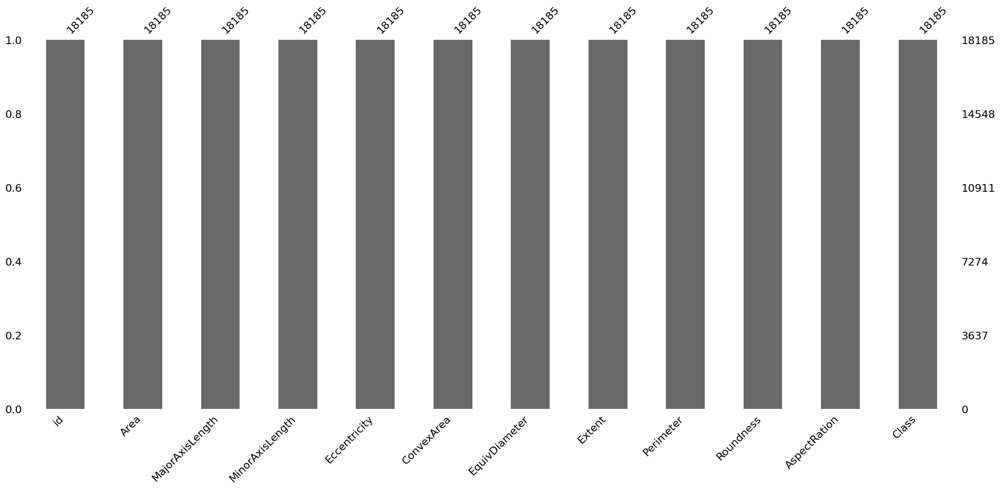

In [8]:
msno.bar(df)


датасет не содержит пропусков данных

In [9]:
print('There are total',df['Class'].nunique(),'unique values in the outcome column')
print('Unique values in outcome column are',df['Class'].unique())

There are total 2 unique values in the outcome column
Unique values in outcome column are [1 0]


In [10]:
print('Total number of 0(False count) are',(df['Class']==0).sum())
print('Total number of 1(True count) are',(df['Class']==1).sum())

Total number of 0(False count) are 8200
Total number of 1(True count) are 9985


C:\Users\Maria\AppData\Local\Temp\ipykernel_20540\3240997452.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




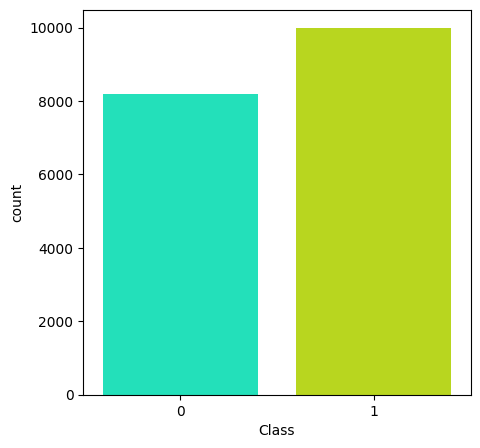

In [11]:
plt.figure(figsize=(5,5))
colors = ['#04FFCD','#CCF500']
sns.countplot(x='Class',data=df,palette=colors)
plt.show()

данные являются сбалансированными

In [12]:
df.drop(columns=['id'],inplace=True)
df

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,4537,92.229316,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796,1
1,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137,1
2,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950,1
3,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456,1
4,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000,1
...,...,...,...,...,...,...,...,...,...,...,...
18180,5853,148.624571,51.029281,0.939210,6008,86.326537,0.498594,332.960,0.663444,2.912535,0
18181,7585,169.593996,58.141659,0.939398,7806,98.272692,0.647461,385.506,0.641362,2.916910,0
18182,6365,154.777085,52.908085,0.939760,6531,90.023162,0.561287,342.253,0.682832,2.925396,0
18183,5960,151.397924,51.474600,0.940427,6189,87.112041,0.492399,343.371,0.635227,2.941216,0


In [13]:
df.corr()


,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
Area,1.000000,0.599939,0.930215,-0.550073,0.999362,0.998158,0.230541,0.881540,0.620490,-0.623979,-0.816589
MajorAxisLength,0.599939,1.000000,0.273211,0.295717,0.602061,0.618002,-0.073549,0.870178,-0.202566,0.240471,-0.147741
MinorAxisLength,0.930215,0.273211,1.000000,-0.808640,0.928992,0.923790,0.308541,0.674249,0.834398,-0.860516,-0.917766
Eccentricity,-0.550073,0.295717,-0.808640,1.000000,-0.547896,-0.534688,-0.329954,-0.165915,-0.903657,0.950301,0.788636
ConvexArea,0.999362,0.602061,0.928992,-0.547896,1.000000,0.997403,0.227359,0.886987,0.610236,-0.621472,-0.814214
EquivDiameter,0.998158,0.618002,0.923790,-0.534688,0.997403,1.000000,0.225944,0.891567,0.607432,-0.609957,-0.809361
Extent,0.230541,-0.073549,0.308541,-0.329954,0.227359,0.225944,1.000000,0.073227,0.366793,-0.350875,-0.303440
Perimeter,0.881540,0.870178,0.674249,-0.165915,0.886987,0.891567,0.073227,1.000000,0.186063,-0.227256,-0.533274
Roundness,0.620490,-0.202566,0.834398,-0.903657,0.610236,0.607432,0.366793,0.186063,1.000000,-0.947875,-0.831759
AspectRation,-0.623979,0.240471,-0.860516,0.950301,-0.621472,-0.609957,-0.350875,-0.227256,-0.947875,1.000000,0.832563


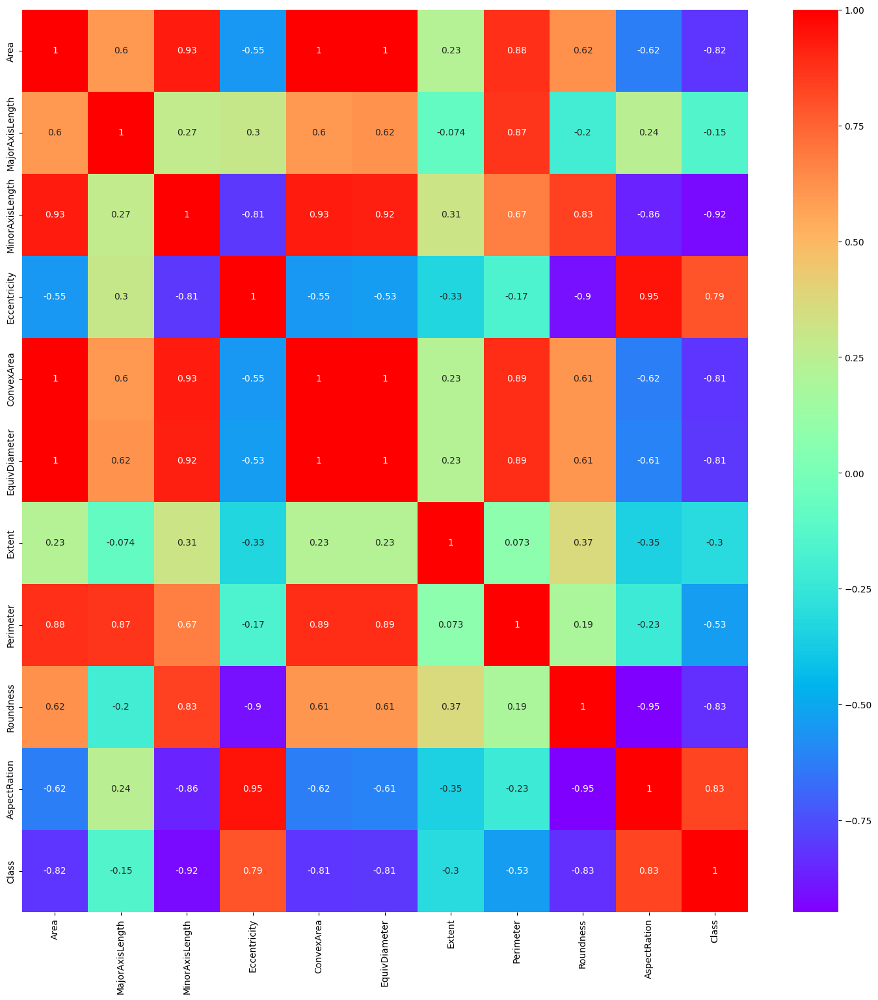

In [14]:
correlation_mat = df.corr()
corr_features = correlation_mat.index
plt.figure(figsize=(18,18))
g = sns.heatmap(df[corr_features].corr(),annot=True,cmap='rainbow')
plt.show()

Удаление выбросов

In [15]:
df

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,4537,92.229316,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796,1
1,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137,1
2,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950,1
3,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456,1
4,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000,1
...,...,...,...,...,...,...,...,...,...,...,...
18180,5853,148.624571,51.029281,0.939210,6008,86.326537,0.498594,332.960,0.663444,2.912535,0
18181,7585,169.593996,58.141659,0.939398,7806,98.272692,0.647461,385.506,0.641362,2.916910,0
18182,6365,154.777085,52.908085,0.939760,6531,90.023162,0.561287,342.253,0.682832,2.925396,0
18183,5960,151.397924,51.474600,0.940427,6189,87.112041,0.492399,343.371,0.635227,2.941216,0


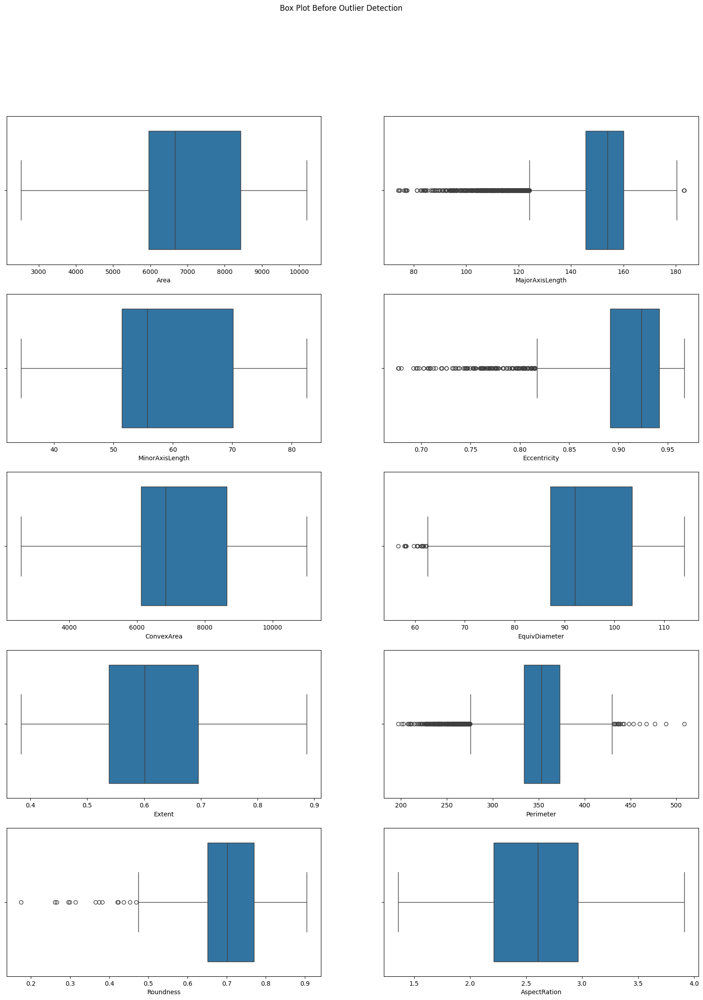

In [19]:
fig, axes = plt.subplots(5,2, figsize=(20,25))
fig.suptitle('Box Plot Before Outlier Detection')
k = 0
for i in range(0,5):
    for j in range(0,2):
        sns.boxplot(ax=axes[i,j], data=df, x=df.columns[k])
        k=k+1

In [ ]:
def iqr_calculation(main_df,col):
    Q1 = np.percentile(col,25,interpolation = 'midpoint')
    Q3 = np.percentile(col,75,interpolation = 'midpoint')
    IQR = Q3 - Q1
    upper = np.where(col>=(Q3+1.5*IQR))
    lower = np.where(col<=(Q1-1.5*IQR))
    return upper,lower

# Remove the outliers
def remove_outliers(main_df,upper,lower):
    main_df.drop(upper[0], inplace = True)
    main_df.drop(lower[0], inplace = True)
    print("New Shape: ", main_df.shape)
    return main_df

# Resetting the dataframe index
def reset_dataframe(main_df):
    main_df.reset_index(inplace=True)
    main_df.drop(columns=['index'],inplace=True)
    return main_df

In [21]:
main_df = df

for i in range(0,len(main_df.columns)-1):
    print('For ',df.columns[i])
    upper, lower = iqr_calculation(main_df,df[df.columns[i]])
    main_df = remove_outliers(main_df,upper,lower)
    final_df = reset_dataframe(main_df)

For  Area
New Shape:  (18185, 11)
For  MajorAxisLength
New Shape:  (17647, 11)
For  MinorAxisLength
New Shape:  (17647, 11)
For  Eccentricity
New Shape:  (17631, 11)
For  ConvexArea
New Shape:  (17631, 11)
For  EquivDiameter
New Shape:  (17631, 11)
For  Extent
New Shape:  (17631, 11)
For  Perimeter
New Shape:  (17602, 11)
For  Roundness
New Shape:  (17597, 11)
For  AspectRation
New Shape:  (17597, 11)


C:\Users\Maria\AppData\Local\Temp\ipykernel_20540\3483569477.py:5: DeprecationWarning:

the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)

C:\Users\Maria\AppData\Local\Temp\ipykernel_20540\3483569477.py:5: DeprecationWarning:

the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)

C:\Users\Maria\AppData\Local\Temp\ipykernel_20540\3483569477.py:5: DeprecationWarning:

the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)

C:\Users\Maria\AppData\Local\Te

In [22]:
final_df


,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,6374,129.576759,63.762307,0.870549,6476,90.086785,0.662234,314.656,0.809003,2.032184,1
1,6946,136.303603,65.738475,0.876009,7115,94.042128,0.594437,338.782,0.760508,2.073422,1
2,5786,125.555431,59.626250,0.880040,5945,85.831020,0.623491,307.304,0.769931,2.105707,1
3,5896,127.013995,59.843292,0.882050,6092,86.643063,0.610352,309.264,0.774655,2.122443,1
4,6082,129.098407,60.416315,0.883736,6204,87.999107,0.661375,308.106,0.805111,2.136814,1
...,...,...,...,...,...,...,...,...,...,...,...
17592,5853,148.624571,51.029281,0.939210,6008,86.326537,0.498594,332.960,0.663444,2.912535,0
17593,7585,169.593996,58.141659,0.939398,7806,98.272692,0.647461,385.506,0.641362,2.916910,0
17594,6365,154.777085,52.908085,0.939760,6531,90.023162,0.561287,342.253,0.682832,2.925396,0
17595,5960,151.397924,51.474600,0.940427,6189,87.112041,0.492399,343.371,0.635227,2.941216,0


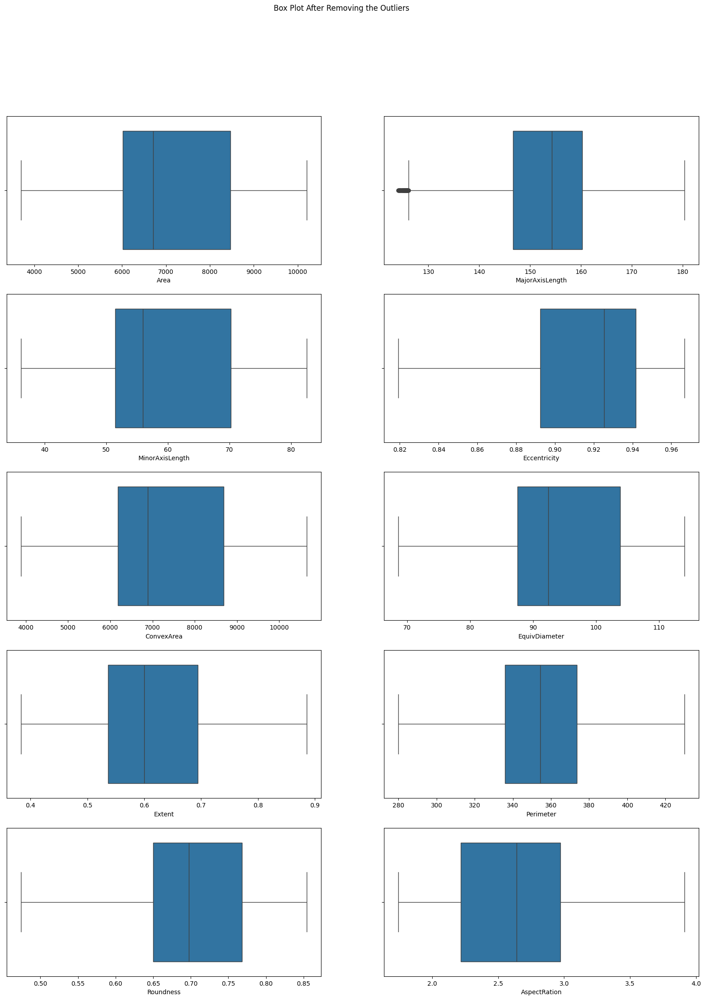

In [24]:
fig, axes = plt.subplots(5,2, figsize=(20,25))
fig.suptitle('Box Plot After Removing the Outliers')
k = 0
for i in range(0,5):
    for j in range(0,2):
        col_name = final_df.columns[k]
        sns.boxplot(ax=axes[i,j], data=final_df,x=col_name)
        k=k+1


визуализация данных

In [25]:
lst = [i for i in final_df.columns]
fig = make_subplots(rows=5, cols=2,subplot_titles=(lst))

k=0
for i in range(1,6):
    for j in range(1,3):
        col_name = final_df.columns[k]
        fig.append_trace(go.Histogram(x=final_df[final_df.columns[k]],name=final_df.columns[k]), row=i, col=j)
        fig.update_layout(
                            template='plotly_dark',
                            height=1500,
                            width=1200,
                            title_text="Histogram of all the input features",
                            font_family="Times New Roman"
                        )
        k=k+1

fig.show()

In [ ]:
lst = [i for i in final_df.columns]
fig = make_subplots(rows=5, cols=2,subplot_titles=(lst))

k=0
for i in range(1,6):
    for j in range(1,3):
        col_name = final_df.columns[k]
        fig.append_trace(go.Violin(y=final_df[final_df.columns[k]],name=final_df.columns[k],box_visible=True), row=i, col=j)
        fig.update_layout(
                            template='plotly_dark',
                            height=2000,
                            width=1200,
                            title_text="Violin Plot of all the input features",
                            font_family="Times New Roman"
                        )
        k=k+1

fig.show()

Применение стандартизации и разделение обучающих данных

In [27]:
y = final_df['Class']
X = final_df.drop(columns=['Class'])
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=42)

In [28]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_train_scaled

array([[-0.7085519 , -0.22947603, -0.73742939, ..., -0.43844144,
        -0.79852573,  0.59201328],
       [ 1.06330706,  0.37240698,  1.11181697, ...,  0.94864149,
         0.76111001, -0.97183266],
       [-1.11956104,  0.59292898, -1.53021312, ..., -0.49685187,
        -1.66834014,  2.22485329],
       ...,
       [-0.15771492,  1.08939692, -0.50527081, ...,  0.3993044 ,
        -0.82063083,  0.86632641],
       [-0.3130792 , -0.10765373, -0.26678111, ...,  0.27457663,
        -0.9658156 ,  0.08529922],
       [ 0.8585087 ,  0.40863635,  0.86915486, ...,  0.66992259,
         0.80903888, -0.7755498 ]])

In [29]:
X_test_scaled = scaler.transform(X_test)
X_test_scaled

array([[-1.02069286, -1.17932721, -0.77358667, ..., -1.24014103,
        -0.29294766,  0.21432256],
       [ 0.33803837,  1.35059936, -0.09388449, ...,  0.6693412 ,
        -0.21465292,  0.47844359],
       [ 1.98984312,  1.0511613 ,  1.85372642, ...,  1.76836421,
         1.14707079, -1.26192683],
       ...,
       [-0.09486301, -1.29257639,  0.44583007, ..., -0.52433229,
         0.76827926, -1.03687044],
       [ 0.45809258,  0.06774699,  0.52669537, ...,  0.32283209,
         0.56091168, -0.61391138],
       [-0.62380775,  0.5792953 , -0.93232649, ..., -0.18045882,
        -0.98653376,  1.22561043]])

Логистическая регрессия

In [31]:
from sklearn.linear_model import LogisticRegression as lr
lr_model = lr()
lr_model.fit(X_train_scaled,y_train)
y_predicted = lr_model.predict(X_test_scaled)
print("Accuracy of Logistic Regression Model is = {0: .3f}".format(metrics.accuracy_score(y_test,y_predicted)))

Accuracy of Logistic Regression Model is =  0.991


In [32]:
print("Total 0's in training data:",(y_train == 0).sum())
print("Total 1's in training data:",(y_train == 1).sum())
print("Total 0's in testing data:",(y_test == 0).sum())
print("Total 1's in testing data:",(y_test == 1).sum())

Total 0's in training data: 5646
Total 1's in training data: 6671
Total 0's in testing data: 2409
Total 1's in testing data: 2871


### Важность функции логистической регрессии

Мы можем подогнать модель логистической регрессии к данному набору данных и получить свойство coeff_, которое содержит коэффициенты, найденные для каждой входной переменной.

Эти коэффициенты могут служить основой для грубой оценки важности признаков. При этом предполагается, что входные переменные имеют одинаковый масштаб или были масштабированы до подбора модели.

Результаты могут различаться в зависимости от стохастической природы алгоритма или процедуры оценки или различий в числовой точности.

Мы знаем, что это проблема классификации с классами 0 и 1. Обратите внимание, что коэффициенты как положительные, так и отрицательные. Положительные оценки указывают на признак, который предсказывает класс 1, тогда как отрицательные оценки указывают на признак, который предсказывает класс 0.

Из этих результатов невозможно выявить четкую структуру важных и неважных особенностей.

In [ ]:
importance = lr_model.coef_[0]

for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))

fig = px.bar(x=[x for x in range(len(importance))], y=importance)
fig.update_layout(template='plotly_dark',
                  height=700,
                  width=1000,
                  title_text="Feature score using Logistic Regression",
                  xaxis_title="Total number of features",
                  yaxis_title="Importance of each feature",
                  font=dict(
                            family="Times New Roman, monospace",
                            size=14,
                            color="White"
                           )
                 )
fig.show()

Feature: 0, Score: -1.60135
Feature: 1, Score: 1.34106
Feature: 2, Score: -0.73817
Feature: 3, Score: 0.24808
Feature: 4, Score: -2.28418
Feature: 5, Score: -1.65657
Feature: 6, Score: 0.01625
Feature: 7, Score: -0.02660
Feature: 8, Score: -2.80392
Feature: 9, Score: 0.73150


### Логистическая регрессия на самом деле не имеет каких-либо критических гиперпараметров для настройки. 

Но иногда мы можем видеть полезные различия в производительности или сходимости с разными решателями.

Регуляризация (штраф) также иногда может быть полезна.

Имеющийся параметр C помогает контролировать силу штрафа, что также может быть эффективным.

В приведенном ниже фрагменте кода я использовала GridSearchCV для настройки гиперпараметров.

In [34]:
lr_model = lr()

solvers = ['newton-cg','lbfgs','liblinear']
penalty = ['l2']
c_values = [100, 10, 1.0, 0.1, 0.01]

grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search_lr = GridSearchCV(estimator=lr_model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_search_lr.fit(X_train_scaled, y_train)

print(grid_search_lr)
print("Best accuracy: %f using %s" % (grid_search_lr.best_score_, grid_search_lr.best_params_))

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=10, random_state=1),
             error_score=0, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [100, 10, 1.0, 0.1, 0.01], 'penalty': ['l2'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             scoring='accuracy')
Best accuracy: 0.989743 using {'C': 100, 'penalty': 'l2', 'solver': 'newton-cg'}


In [35]:
y_score = grid_search_lr.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_score)
fig_hist = px.histogram(x=y_score, color=y_test,nbins=50,labels=dict(color='True Labels', x='Score'))
fig_hist.show()

In [36]:
df = pd.DataFrame({
    'False Positive Rate': fpr,
    'True Positive Rate': tpr
}, index=thresholds)
df.index.name = "Thresholds"
df.columns.name = "Rate"

fig_thresh = px.line(
    df, title='TPR and FPR at every threshold',
)

fig_thresh.update_yaxes(scaleanchor="x", scaleratio=1)
fig_thresh.update_xaxes(range=[0, 1], constrain='domain')
fig_thresh.show()

In [37]:
y_score = grid_search_lr.predict_proba(X_test_scaled)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_score)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(showgrid=False,scaleanchor="x", scaleratio=1)
fig.update_xaxes(showgrid=False,constrain='domain')
fig.show()

In [38]:
y_predicted = grid_search_lr.predict(X_test_scaled)
print("Accuracy of Logistic Regression Model after Hyper-Parameter Tuning is = {0: .3f}".format(metrics.accuracy_score(y_test,y_predicted)))
lr_score = metrics.accuracy_score(y_test,y_predicted)

Accuracy of Logistic Regression Model after Hyper-Parameter Tuning is =  0.992


In [39]:
y_actual = y_test
y_actual = y_actual.to_numpy() #  COnverting to numpy array
y_actual

array([1, 0, 0, ..., 0, 0, 1], dtype=int64)

In [40]:
target_names = ['class 0', 'class 1']
print(classification_report(y_actual, y_predicted, target_names=target_names))

              precision    recall  f1-score   support

     class 0       1.00      0.99      0.99      2409
     class 1       0.99      1.00      0.99      2871

    accuracy                           0.99      5280
   macro avg       0.99      0.99      0.99      5280
weighted avg       0.99      0.99      0.99      5280



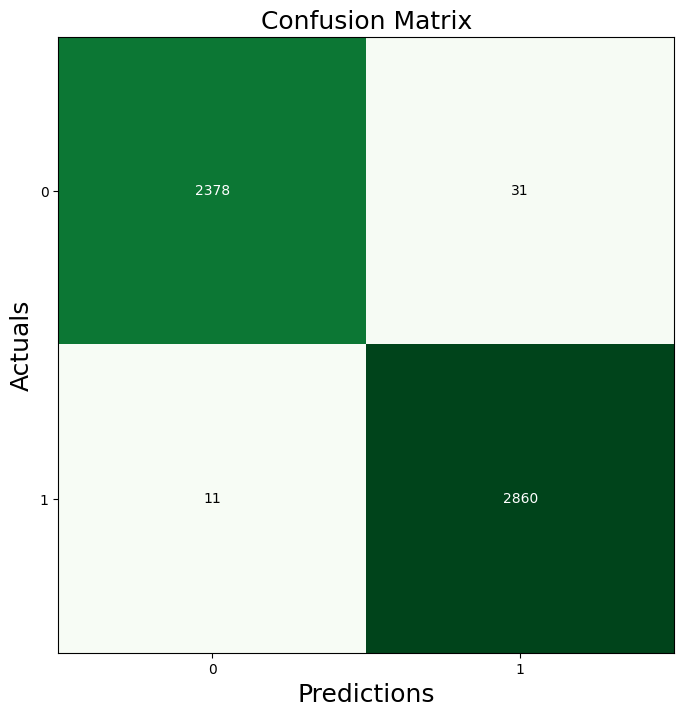

In [41]:
conf_matrix = confusion_matrix(y_true=y_actual, y_pred=y_predicted)
fig, ax = plot_confusion_matrix(conf_mat=conf_matrix, figsize=(8,8), cmap=plt.cm.Greens)
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

дерево решений

In [42]:
from sklearn.tree import DecisionTreeClassifier
dtc_model = DecisionTreeClassifier()
dtc_model.fit(X_train_scaled,y_train)
y_predicted = dtc_model.predict(X_test_scaled)
print("Accuracy of Decision Tree Model is = {0: .3f}".format(metrics.accuracy_score(y_test,y_predicted)))

Accuracy of Decision Tree Model is =  0.986


In [ ]:
importance = dtc_model.feature_importances_

for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))

fig = px.bar(x=[x for x in range(len(importance))], y=importance)
fig.update_layout(template='plotly_dark',
                  height=700,
                  width=1000,
                  title_text="Feature score using Decision Tree Classifier",
                  xaxis_title="Total number of features",
                  yaxis_title="Importance of each feature",
                  font=dict(
                            family="Times New Roman, monospace",
                            size=14,
                            color="White"
                           )
                 )
fig.show()

Feature: 0, Score: 0.00201
Feature: 1, Score: 0.00363
Feature: 2, Score: 0.95946
Feature: 3, Score: 0.00302
Feature: 4, Score: 0.00220
Feature: 5, Score: 0.00080
Feature: 6, Score: 0.00378
Feature: 7, Score: 0.00291
Feature: 8, Score: 0.01980
Feature: 9, Score: 0.00238


In [44]:
dtc_model = DecisionTreeClassifier()
params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}
#cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search_dtc = GridSearchCV(estimator=dtc_model, param_grid=params, cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")
grid_search_dtc.fit(X_train_scaled, y_train)

print(grid_search_dtc)
print("Best accuracy: %f using %s" % (grid_search_dtc.best_score_, grid_search_dtc.best_params_))

Fitting 4 folds for each of 50 candidates, totalling 200 fits
GridSearchCV(cv=4, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='accuracy', verbose=1)
Best accuracy: 0.988877 using {'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 20}


In [45]:
score_df = pd.DataFrame(grid_search_dtc.cv_results_)
score_df.head(10)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.042880,0.005043,0.002942,0.000250,gini,2,5,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.985065,0.985060,0.984411,0.982787,0.984331,0.000930,39
1,0.047496,0.006852,0.001989,0.000730,gini,2,10,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.985065,0.985060,0.984411,0.982787,0.984331,0.000930,39
2,0.043531,0.007193,0.001955,0.000338,gini,2,20,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.985065,0.985060,0.984411,0.982787,0.984331,0.000930,39
3,0.045731,0.006111,0.001916,0.000146,gini,2,50,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.985065,0.985060,0.983436,0.982787,0.984087,0.001002,42
4,0.035720,0.004160,0.002719,0.000509,gini,2,100,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.985065,0.985060,0.983111,0.982787,0.984006,0.001063,43
5,0.070851,0.017556,0.001642,0.000412,gini,3,5,"{'criterion': 'gini', 'max_depth': 3, 'min_sam...",0.986039,0.990257,0.981812,0.986684,0.986198,0.002999,21
6,0.072212,0.008753,0.002502,0.000501,gini,3,10,"{'criterion': 'gini', 'max_depth': 3, 'min_sam...",0.986039,0.990257,0.982137,0.986684,0.986279,0.002881,20
7,0.073995,0.012880,0.010114,0.008113,gini,3,20,"{'criterion': 'gini', 'max_depth': 3, 'min_sam...",0.985714,0.989932,0.982137,0.986684,0.986117,0.002778,22
8,0.076051,0.014676,0.002504,0.001070,gini,3,50,"{'criterion': 'gini', 'max_depth': 3, 'min_sam...",0.987013,0.989607,0.982462,0.986359,0.986360,0.002558,16
9,0.053318,0.002860,0.002336,0.000583,gini,3,100,"{'criterion': 'gini', 'max_depth': 3, 'min_sam...",0.985065,0.985060,0.983111,0.982787,0.984006,0.001063,43


In [46]:
score_df.tail(10)


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
40,0.252696,0.022622,0.006372,0.003632,entropy,10,5,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.984740,0.984086,0.984086,0.982137,0.983762,0.000976,49
41,0.260193,0.034912,0.004117,0.000776,entropy,10,10,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.987662,0.990581,0.986034,0.983436,0.986929,0.002592,9
42,0.253115,0.024179,0.003455,0.000959,entropy,10,20,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.988961,0.988308,0.987009,0.987334,0.987903,0.000776,4
43,0.252266,0.022670,0.004413,0.001615,entropy,10,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.986364,0.987658,0.986359,0.985060,0.986360,0.000919,13
44,0.203256,0.012113,0.004782,0.001684,entropy,10,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.985065,0.987658,0.984411,0.983761,0.985224,0.001479,28
45,0.263550,0.007388,0.002636,0.000657,entropy,20,5,"{'criterion': 'entropy', 'max_depth': 20, 'min...",0.985390,0.984086,0.981812,0.981163,0.983113,0.001705,50
46,0.272628,0.013648,0.005428,0.001423,entropy,20,10,"{'criterion': 'entropy', 'max_depth': 20, 'min...",0.987662,0.990257,0.986034,0.983436,0.986847,0.002479,10
47,0.247137,0.012774,0.005033,0.003828,entropy,20,20,"{'criterion': 'entropy', 'max_depth': 20, 'min...",0.988961,0.988308,0.987009,0.987334,0.987903,0.000776,4
48,0.243163,0.034656,0.003647,0.000737,entropy,20,50,"{'criterion': 'entropy', 'max_depth': 20, 'min...",0.986364,0.987658,0.986359,0.985060,0.986360,0.000919,13
49,0.189302,0.009093,0.002712,0.000374,entropy,20,100,"{'criterion': 'entropy', 'max_depth': 20, 'min...",0.985065,0.987658,0.984411,0.983761,0.985224,0.001479,28


In [47]:
y_score = grid_search_dtc.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_score)
fig_hist = px.histogram(x=y_score, color=y_test,nbins=50,labels=dict(color='True Labels', x='Score'))
fig_hist.show()


In [48]:
df = pd.DataFrame({
    'False Positive Rate': fpr,
    'True Positive Rate': tpr
}, index=thresholds)
df.index.name = "Thresholds"
df.columns.name = "Rate"

fig_thresh = px.line(
    df, title='TPR and FPR at every threshold',
)

fig_thresh.update_yaxes(scaleanchor="x", scaleratio=1)
fig_thresh.update_xaxes(range=[0, 1], constrain='domain')
fig_thresh.show()

In [49]:
y_score = grid_search_dtc.predict_proba(X_test_scaled)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_score)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(showgrid=False,scaleanchor="x", scaleratio=1)
fig.update_xaxes(showgrid=False,constrain='domain')
fig.show()

In [50]:
y_predicted = grid_search_dtc.predict(X_test_scaled)
print("Accuracy of Decision Tree Model after Hyper-Parameter Tuning is = {0: .3f}".format(metrics.accuracy_score(y_test,y_predicted)))
dtc_score = metrics.accuracy_score(y_test,y_predicted)

Accuracy of Decision Tree Model after Hyper-Parameter Tuning is =  0.990


In [51]:
y_actual = y_test
y_actual = y_actual.to_numpy() #  COnverting to numpy array
y_actual

array([1, 0, 0, ..., 0, 0, 1], dtype=int64)

In [52]:
target_names = ['class 0', 'class 1']
print(classification_report(y_actual, y_predicted, target_names=target_names))

              precision    recall  f1-score   support

     class 0       0.99      0.98      0.99      2409
     class 1       0.99      0.99      0.99      2871

    accuracy                           0.99      5280
   macro avg       0.99      0.99      0.99      5280
weighted avg       0.99      0.99      0.99      5280



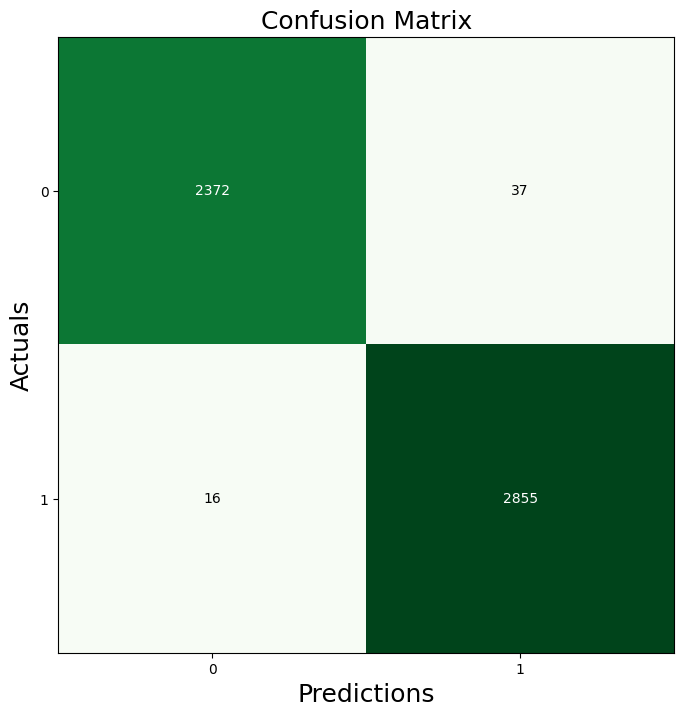

In [53]:
conf_matrix = confusion_matrix(y_true=y_actual, y_pred=y_predicted)
fig, ax = plot_confusion_matrix(conf_mat=conf_matrix, figsize=(8,8), cmap=plt.cm.Greens)
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

Рандомный лес

In [55]:
from sklearn.ensemble import RandomForestClassifier
rfc_model = RandomForestClassifier()
rfc_model.fit(X_train_scaled,y_train)
y_predicted = rfc_model.predict(X_test_scaled)
print("Accuracy of Random Forest Classifier Model is = {0: .3f}".format(metrics.accuracy_score(y_test,y_predicted)))

Accuracy of Random Forest Classifier Model is =  0.991


In [ ]:
importance = rfc_model.feature_importances_

for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))

fig = px.bar(x=[x for x in range(len(importance))], y=importance)
fig.update_layout(template='plotly_dark',
                  height=700,
                  width=1000,
                  title_text="Feature score using Random Forest Classifier",
                  xaxis_title="Total number of features",
                  yaxis_title="Importance of each feature",
                  font=dict(
                            family="Times New Roman, monospace",
                            size=14,
                            color="White"
                           )
                 )
fig.show()

Feature: 0, Score: 0.06638
Feature: 1, Score: 0.00363
Feature: 2, Score: 0.29148
Feature: 3, Score: 0.18826
Feature: 4, Score: 0.03182
Feature: 5, Score: 0.06057
Feature: 6, Score: 0.00376
Feature: 7, Score: 0.00924
Feature: 8, Score: 0.19891
Feature: 9, Score: 0.14595


In [57]:
fc_model = RandomForestClassifier()
params = {
    'n_estimators' : [10, 100, 1000],
    'max_features' : ['sqrt', 'log2']
}
#cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search_rfc = GridSearchCV(estimator=rfc_model, param_grid=params, cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")
grid_search_rfc.fit(X_train_scaled, y_train)

print(grid_search_rfc)
print("Best accuracy: %f using %s" % (grid_search_rfc.best_score_, grid_search_rfc.best_params_))

Fitting 4 folds for each of 6 candidates, totalling 24 fits
GridSearchCV(cv=4, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_features': ['sqrt', 'log2'],
                         'n_estimators': [10, 100, 1000]},
             scoring='accuracy', verbose=1)
Best accuracy: 0.987903 using {'max_features': 'log2', 'n_estimators': 1000}


In [58]:
score_df = pd.DataFrame(grid_search_rfc.cv_results_)
score_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.241931,0.008280,0.003834,0.003656,sqrt,10,"{'max_features': 'sqrt', 'n_estimators': 10}",0.987987,0.988308,0.984735,0.985385,0.986604,0.001565,6
1,2.280516,0.062140,0.026505,0.003765,sqrt,100,"{'max_features': 'sqrt', 'n_estimators': 100}",0.988312,0.989932,0.986359,0.985710,0.987578,0.001662,4
2,22.754992,0.618202,0.160800,0.014431,sqrt,1000,"{'max_features': 'sqrt', 'n_estimators': 1000}",0.987987,0.990581,0.986684,0.986034,0.987822,0.001742,2
3,0.218473,0.010016,0.004881,0.003364,log2,10,"{'max_features': 'log2', 'n_estimators': 10}",0.987338,0.989932,0.984735,0.985060,0.986766,0.002085,5
4,2.124925,0.073362,0.020996,0.002986,log2,100,"{'max_features': 'log2', 'n_estimators': 100}",0.988312,0.990257,0.986359,0.986034,0.987740,0.001694,3
5,21.388499,0.260268,0.157630,0.022660,log2,1000,"{'max_features': 'log2', 'n_estimators': 1000}",0.988312,0.990581,0.986034,0.986684,0.987903,0.001755,1


In [59]:
y_score = grid_search_rfc.predict_proba(X_test_scaled)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_score)
fig_hist = px.histogram(x=y_score, color=y_test,nbins=50,labels=dict(color='True Labels', x='Score'))
fig_hist.show()

In [60]:
df = pd.DataFrame({
    'False Positive Rate': fpr,
    'True Positive Rate': tpr
}, index=thresholds)
df.index.name = "Thresholds"
df.columns.name = "Rate"

fig_thresh = px.line(
    df, title='TPR and FPR at every threshold',
)

fig_thresh.update_yaxes(scaleanchor="x", scaleratio=1)
fig_thresh.update_xaxes(range=[0, 1], constrain='domain')
fig_thresh.show()

In [61]:
y_score = grid_search_rfc.predict_proba(X_test_scaled)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_score)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(showgrid=False,scaleanchor="x", scaleratio=1)
fig.update_xaxes(showgrid=False,constrain='domain')
fig.show()


In [62]:
y_predicted = grid_search_rfc.predict(X_test_scaled)
print("Accuracy of Decision Tree Model after Hyper-Parameter Tuning is = {0: .3f}".format(metrics.accuracy_score(y_test,y_predicted)))
rfc_score = metrics.accuracy_score(y_test,y_predicted)

Accuracy of Decision Tree Model after Hyper-Parameter Tuning is =  0.991


In [63]:
y_actual = y_test
y_actual = y_actual.to_numpy() #  COnverting to numpy array
y_actual

array([1, 0, 0, ..., 0, 0, 1], dtype=int64)

In [64]:
target_names = ['class 0', 'class 1']
print(classification_report(y_actual, y_predicted, target_names=target_names))

              precision    recall  f1-score   support

     class 0       0.99      0.99      0.99      2409
     class 1       0.99      1.00      0.99      2871

    accuracy                           0.99      5280
   macro avg       0.99      0.99      0.99      5280
weighted avg       0.99      0.99      0.99      5280



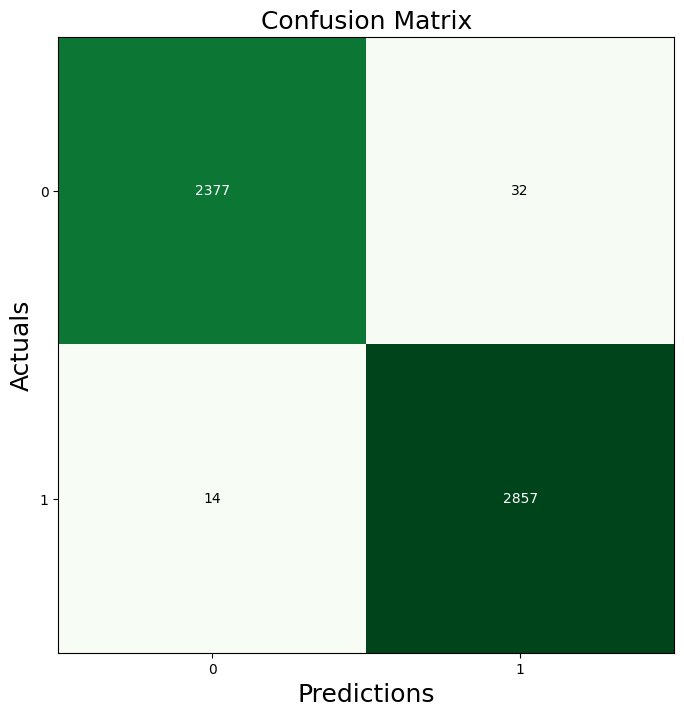

In [65]:
conf_matrix = confusion_matrix(y_true=y_actual, y_pred=y_predicted)
fig, ax = plot_confusion_matrix(conf_mat=conf_matrix, figsize=(8,8), cmap=plt.cm.Greens)
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

In [66]:
models = pd.DataFrame({
    'Model' : [ 'Logistic Regression', 'Decision Tree Classifier', 'Random Forest Classifier'],
    'Score' : [ lr_score, dtc_score, rfc_score]
})
models.sort_values(by = 'Score', ascending = False)

,Model,Score
0,Logistic Regression,0.992045
2,Random Forest Classifier,0.991288
1,Decision Tree Classifier,0.989962


In [ ]:
px.bar(data_frame = models, x = 'Score', y = 'Model', color = 'Score', template = 'plotly_dark',
       title = 'Comparison of Classification Algorithms')